# Analyse Vino

# ETAPE 1

# 1. Chargement et description des données

1.1. Importation de libraries 

In [1]:
import pandas as pd 
import numpy as np 
import os 
import  datetime  as  dt
import plotly.express as px # Plotly Express est une API laconique, cohérente et de haut niveau pour la création de figure
import plotly.offline as py
import plotly.graph_objs as go
from plotly.figure_factory import create_table
import matplotlib as mpl #  bibliothèque complète pour la création de visualisations statiques
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt 
from datetime import datetime 
import seaborn as sns # Pour la gestion des données manquante en particulier la visualisation 

1.2. Importation des données 

In [2]:
file_path="Analyse_Vino"
file_dir=os.path.dirname(file_path)

In [3]:
DataCapt = pd.read_csv('Capteurs.txt', delimiter=";", quotechar='"', iterator=True, chunksize=10000)

In [4]:
DataCapt

In [5]:
Capt = pd.concat(DataCapt, ignore_index=True)

In [6]:
Capt

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,RE210ZT04,CC211,RE210AG01,RE210VA07,RE210VA08,GF210VA02,RE210ZD01C,DateTime_Out
0,01/01/2018 00:00:00,"0,00","20,9","21,0","0,0",0,"-0,01","20,7","21,0","21,1","20,8","0,0",0,"0,0","0,0","0,0",9,2018-01-01 00:00:00
1,01/01/2018 00:00:10,"0,00","20,9","21,0","0,0",0,"-0,01","20,7","20,9","21,1","20,8","0,0",0,"0,0","0,0","0,0",9,2018-01-01 00:00:10
2,01/01/2018 00:00:20,"0,00","20,9","21,0","0,0",0,"-0,01","20,7","20,9","21,1","20,8","0,0",0,"0,0","0,0","0,0",9,2018-01-01 00:00:20
3,01/01/2018 00:00:30,"0,00","20,9","21,0","0,0",0,"-0,01","20,8","20,9","21,1","20,8","0,0",0,"0,0","0,0","0,0",9,2018-01-01 00:00:30
4,01/01/2018 00:00:40,"0,00","20,9","21,0","0,0",0,"-0,01","20,7","20,9","21,1","20,8","0,0",0,"0,0","0,0","0,0",9,2018-01-01 00:00:40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13251737,18/03/2022 11:33:10,"0,01","21,4","20,4","0,0",0,"-0,01","21,1","21,4","21,8","21,4","0,0",0,"0,0","0,0","0,0",9,2022-03-18 11:33:10
13251738,18/03/2022 11:33:20,"0,01","21,4","20,4","0,0",0,"-0,01","21,2","21,3","21,8","21,4","0,0",0,"0,0","0,0","0,0",9,2022-03-18 11:33:20
13251739,18/03/2022 11:33:30,"0,01","21,5","20,4","0,0",0,"-0,01","21,1","21,3","21,8","21,4","0,0",0,"0,0","0,0","0,0",9,2022-03-18 11:33:30
13251740,18/03/2022 11:33:40,"0,01","21,4","20,4","0,0",0,"-0,01","21,1","21,4","21,8","21,4","0,0",0,"0,0","0,0","0,0",9,2022-03-18 11:33:40


In [7]:
Evt=pd.read_csv("Evenements.csv", encoding = "ISO-8859-1", sep=";")
Evt

,ID Recette,Libelle Recette,Lot,Chapitre Recette,Arborescence,Exécuter,Terminer
0,VLB HAUT RDT,VINORELBINE ETAPE 1,OP744-E1,D1 PREPARATION MATERIEL,1-Séquence,03/04/2018 08:55,03/04/2018 09:43
1,VLB HAUT RDT,VINORELBINE ETAPE 1,OP744-E1,PREPARATION GROUPE FROID ET CHAUD,2-Opération,03/04/2018 08:55,03/04/2018 08:55
2,VLB HAUT RDT,VINORELBINE ETAPE 1,OP744-E1,PREPARATION INERTAGE,2-Opération,03/04/2018 08:55,03/04/2018 09:02
3,VLB HAUT RDT,VINORELBINE ETAPE 1,OP744-E1,AFFRANCHISSEMENT,2-Opération,03/04/2018 09:02,03/04/2018 09:41
4,VLB HAUT RDT,VINORELBINE ETAPE 1,OP744-E1,PREPARATION CH2CL2 POUR VINDO,2-Opération,03/04/2018 09:41,03/04/2018 09:43
...,...,...,...,...,...,...,...
4093,VLB HAUT RDT,VINORELBINE ETAPE 1,2COEH-E1,D11.1 TRAITEMENT DES JUS MERE AVLB,2-Opération,03/03/2022 15:23,03/03/2022 18:44
4094,VLB HAUT RDT,VINORELBINE ETAPE 1,2COEH-E1,D12 CH2CL2 POUR DISSOLUTION AVLB,1-Séquence,03/03/2022 18:23,03/03/2022 18:25
4095,VLB HAUT RDT,VINORELBINE ETAPE 1,2COEH-E1,CH2CL2 POUR DISSOLUTION AVLB,2-Opération,03/03/2022 18:23,03/03/2022 18:25
4096,VLB HAUT RDT,VINORELBINE ETAPE 1,2COEH-E1,JUMP ACETONE,2-Opération,03/03/2022 18:43,03/03/2022 19:07


In [16]:
import re
import warnings
#from pandas.core.common import SettingWithCopyWarning   # SettingWithCopyWarning donne des avertissements sur les erreurs
#warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
#warnings.simplefilter(action = 'ignore')
qm_path = 'C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Data and Script'
output_path = './'

In [18]:
#filante = pd.read_excel('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Data and Script/Filante Vinorelbine.xlsx', sheet_name='AVLB',converters={'OP':str} )
#filante.head(3)

In [10]:
#dimensions : nombre de lignes, nombre de colonnes #la ligne d'en-tête n'est pas comptabilisée #dans le nombre de lignes
print(Capt.shape)

(13251742, 18)


In [29]:
#énumération des colonnes
print(Capt.columns)

Index(['DateTime', 'BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C', 'DateTime_Out'],
      dtype='object')


In [12]:
#dimensions : nombre de lignes, nombre de colonnes #la ligne d'en-tête n'est pas comptabilisée #dans le nombre de lignes
print(Evt.shape)

(4098, 7)


In [11]:
#énumération des colonnes
print(Evt.columns)

Index(['ID Recette', 'Libelle Recette', 'Lot', 'Chapitre Recette',
       'Arborescence', 'Exécuter', 'Terminer'],
      dtype='object')


### 2. Préprocessing 

#2.1. Fichier Capteurs 

In [ ]:
###Gestion des données manquantes 

In [13]:
mv = Capt.isnull().sum()
mv

DateTime         0
BC210ZP01        0
CC211ZT02        0
GF210ZT01        0
RE210ZD01        1
RE210ZN01        1
RE210ZP01        1
RE210ZT01        1
RE210ZT02        1
RE210ZT03        1
RE210ZT04        1
CC211           10
RE210AG01       10
RE210VA07       10
RE210VA08       10
GF210VA02       10
RE210ZD01C      78
DateTime_Out    11
dtype: int64

In [ ]:
plt.figure(figsize=(7, 3))   # Evolution des données manquantes 
plt.hist(mv)

In [ ]:
#Valeurs abérantes 

In [19]:
Capt[Capt['DateTime']=='03/11/2020,1'].head()   # affichage des lignes possedant des erreurs sur data time
Capt[Capt['DateTime']=='23/01/2021,1'].head()

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,RE210ZT04,CC211,RE210AG01,RE210VA07,RE210VA08,GF210VA02,RE210ZD01C,DateTime_Out
9645695,"23/01/2021,1","21,3","-0,01",0,"21,5","-0,01","21,6","-0,01","-0,01","24,2",0,0,"2,34","10,63",0,"20,7",NaN,NaN
9645823,"23/01/2021,1","21,3","-0,01",0,"21,5","-0,01","21,6","-0,01","-0,01","24,2",0,0,"2,34","10,89",0,"20,7",NaN,NaN
9645951,"23/01/2021,1","21,3","-0,01",0,"21,6","-0,01","21,6","-0,01","-0,01","24,1",0,0,"2,34","11,18",0,"20,7",NaN,NaN
9646079,"23/01/2021,1","21,2","-0,01",0,"21,5","-0,01","21,6","-0,01","-0,01","24,1",0,0,"2,34","10,82",0,"20,7",NaN,NaN


In [ ]:
###Suppression des lignes comportants des données manquante et des abérations sur les dates

In [11]:
Capt=Capt.dropna(subset=['DateTime', 'BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C'])

In [ ]:
##Vérification de l'effectivité de la suppression des NA

In [43]:
mv = Capt.isnull().sum()
mv

DateTime      0
BC210ZP01     0
CC211ZT02     0
GF210ZT01     0
RE210ZD01     0
RE210ZN01     0
RE210ZP01     0
RE210ZT01     0
RE210ZT02     0
RE210ZT03     0
RE210ZT04     0
CC211         0
RE210AG01     0
RE210VA07     0
RE210VA08     0
GF210VA02     0
RE210ZD01C    0
dtype: int64

In [ ]:
###Suppression de la colonne DateTime_Out

In [ ]:
#Remplacer des "," en points et converstion des variables en float

In [ ]:
Capt.head()

#2.2. Fichier Evènements

In [ ]:
###Gestion des données manquantes 

#commentaire 

Nous constantons que certaines variables possèdent des valeurs manquantes. Il s'agit des variables : . C'est ce qui retrace le graphique ci-après

In [48]:
me = Evt.isnull().sum()
me

ID Recette           0
Libelle Recette      0
Lot                  0
Chapitre Recette     0
Arborescence         0
Exécuter             0
Terminer            20
dtype: int64

(array([6., 0., 0., 0., 0., 0., 0., 0., 0., 1.]),
 array([ 0.,  2.,  4.,  6.,  8., 10., 12., 14., 16., 18., 20.]),
 <BarContainer object of 10 artists>)

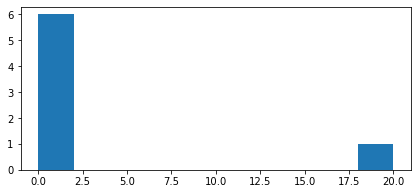

In [49]:
plt.figure(figsize=(7, 3))
plt.hist(me)

In [ ]:
### Suppression des données manquantes 

In [ ]:
Evt=Evt.dropna(subset=['Lot']) 

In [ ]:
### Transformation des valeur 

In [ ]:
Evt['Lot']=Evt['Lot'].replace(['OP','_','-','BIS','E1'], '', regex=True)

In [ ]:
Evt1= Evt['Arborescence'] == '1-Séquence'
Evt_f=Evt[Evt1]

In [ ]:
Evt_f

In [ ]:
fe = filante['OP'].isnull().sum()
fe

In [ ]:
### Suppression des données manquante sur la colonne lot

In [ ]:
filante1=filante.dropna(subset=['OP'])

#3. Jointure des fichiers 

#3.1. Installation de packages Pyjanitor

#3.2. Importation de packages janitor pour la jointure

In [ ]:
##pip install pyjanitor
import pandas as pd
import janitor

#3.3. Convertir l’argument en timedelta

In [24]:
Evt_f['Exécuter'] = pd.to_datetime(Evt_f.Exécuter)
Evt_f['Terminer'] = pd.to_datetime(Evt_f.Terminer)
Capt['DateTime'] = pd.to_datetime(Capt.DateTime)

#3.4. Jointure à gauche entre fichier capteurs et évènements

In [ ]:
DataCE=Capt.conditional_join(Evt_f, 
        ('DateTime', 'Exécuter', '>='), 
        ('DateTime', 'Terminer', '<='), 
        how = 'left')

In [ ]:
DataCE.head(3)

In [30]:
DataCE.isnull().sum()

DateTime                  0
BC210ZP01                 0
CC211ZT02                 0
GF210ZT01                 0
RE210ZD01                 0
RE210ZN01                 0
RE210ZP01                 0
RE210ZT01                 0
RE210ZT02                 0
RE210ZT03                 0
RE210ZT04                 0
CC211                     0
RE210AG01                10
RE210VA07                 0
RE210VA08                 0
GF210VA02                 0
RE210ZD01C               22
DateTime_Out              0
ID Recette          8473225
Libelle Recette     8473225
Lot                 8473225
Chapitre Recette    8473225
Arborescence        8473225
Exécuter            8473225
Terminer            8473225
dtype: int64

In [ ]:
#suppression des NAN sur la base de  lot 

In [ ]:
Datace=DataCE.dropna(subset=['Lot'])

In [32]:
Datace.shape

(9279806, 25)

In [29]:
Datace['RE210ZD01C']

43200        9.0
43201        9.0
43202        9.0
43203        9.0
43204        9.0
            ... 
17688382    19.0
17688383    19.0
17688384    19.0
17688385    19.0
17688386    19.0
Name: RE210ZD01C, Length: 9279806, dtype: float64

In [ ]:
#Datai=Dataf.set_index('Terminer')

In [ ]:
DATA = pd.merge(Datace, filante1, left_on="Lot", right_on="OP")

In [ ]:
DATA.columns

#4.Dataviz

In [34]:
Data21=DATA[['DateTime','BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C', 'Rendement']]

### 3. Début des analyses 

In [ ]:
# Commentaire 
A ce niveau nous ferons la construction des courbes par chapitre recette
Chaque representation comporte des évolutions des lots par capteurs. 
Ces courbes permettrons de voir les profils de chaque lot pour capteur dans le temps 

#3.1.1.Preparation du matériel, des matières, mise sous azote de l'installation et mise en froid

In [25]:
DATA1= DATA['Chapitre Recette'] == 'D1 PREPARATION MATERIEL'

In [26]:
Data21=DATA[DATA1]
Data21.head(3)

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,...,Unnamed: 19,OP3 de vindoline engagé,Unnamed: 21,OP4 de vindoline engagé,Unnamed: 23,Quantité totale de vindoline,Poids humide d'AVLB,Poids dosé perchlo,Rendement,Unnamed: 28
207359,2018-05-06 03:16:00,0.0,30.2,-31.6,0.0,0,-0.01,28.5,26.0,26.1,...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
207360,2018-05-06 03:16:10,0.0,30.2,-31.6,0.0,0,-0.01,28.5,26.0,26.2,...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
207361,2018-05-06 03:16:20,0.0,30.2,-31.6,0.0,0,-0.01,28.5,26.0,26.2,...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN


#3.2. Essaie de construction de courbe 

In [ ]:
### Dans le soucis de ramener tout les lots au meme point de depart, 
nous avons créee une colonne date pour numéroter les lots. 
La fonction groupby a été utilisé a cet effet

In [27]:
Data21['Date'] = Data21.groupby('Lot').cumcount()
Data21[['DateTime','RE210ZT02','Lot', 'OP','Date']]

,DateTime,RE210ZT02,Lot,OP,Date
207359,2018-05-06 03:16:00,26.0,748,748,0
207360,2018-05-06 03:16:10,26.0,748,748,1
207361,2018-05-06 03:16:20,26.0,748,748,2
207362,2018-05-06 03:16:30,26.0,748,748,3
207363,2018-05-06 03:16:40,26.0,748,748,4
...,...,...,...,...,...
8104317,2021-09-27 18:51:20,19.8,811,811,284
8104318,2021-09-27 18:51:30,19.9,811,811,285
8104319,2021-09-27 18:51:40,19.8,811,811,286
8104320,2021-09-27 18:51:50,19.8,811,811,287


#3.3.Construction des courbes par séquences 

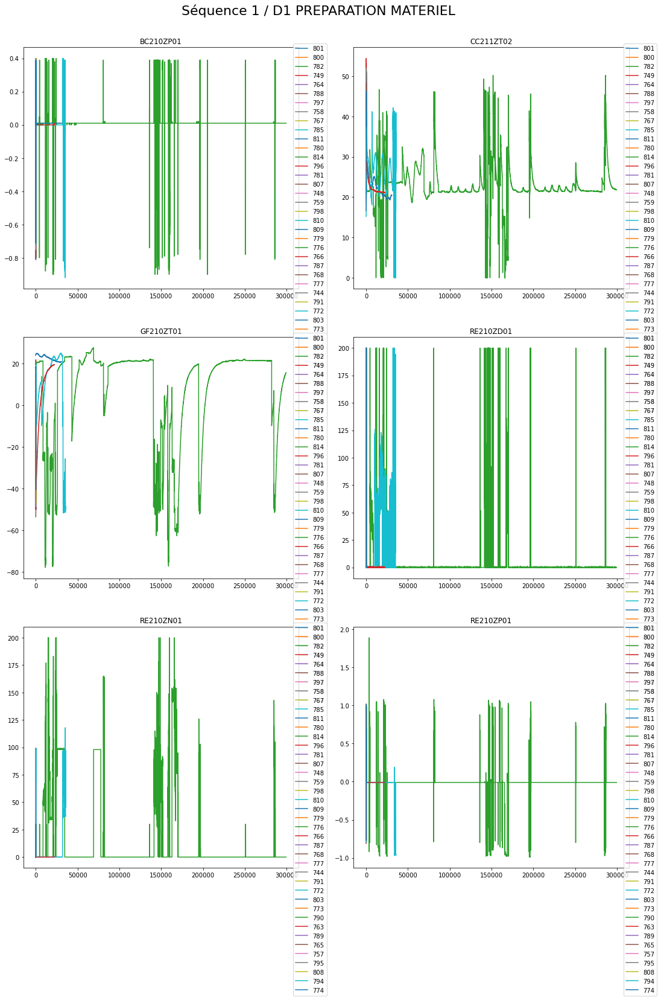

In [28]:
plt.figure(figsize=(18, 25))
OP_set = set(Data21['OP'])   
for op in OP_set:
    selected_data = Data21.loc[Data21['OP'] == op]
    
    j = 321
    for i in ['BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01','RE210ZN01', 'RE210ZP01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / D1 PREPARATION MATERIEL"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/Details/S1_D1_Préparation_Matériel_1.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
Données23.to_excel("C:/Users/amousss/OneDrive - xx SA/Projet Vinorelbine/Alteryx/Données23.xlsx", index = False, header=True)

In [32]:
Data34C= ['D3 PREPARATION SOLUTION MCPBA', 'D4 PREPARATION SOLUTION MCPBA']
Données34= DATA[DATA['Chapitre Recette'].isin(Data34C)]
Données34

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,...,Unnamed: 19,OP3 de vindoline engagé,Unnamed: 21,OP4 de vindoline engagé,Unnamed: 23,Quantité totale de vindoline,Poids humide d'AVLB,Poids dosé perchlo,Rendement,Unnamed: 28
415127,2018-05-06 03:54:00,0.00,37.6,-49.4,0.0,39,-0.01,27.5,24.3,"31,7",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
415131,2018-05-06 03:54:10,0.00,38.0,-49.4,0.0,38,-0.01,27.5,24.3,"32,1",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
415135,2018-05-06 03:54:20,0.00,38.3,-49.4,0.0,39,-0.01,27.4,24.4,"32,4",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
415139,2018-05-06 03:54:30,0.00,38.6,-49.5,0.0,39,-0.01,27.4,24.5,"32,8",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
415143,2018-05-06 03:54:40,0.00,38.9,-49.5,0.0,38,-0.01,27.4,24.6,"33,2",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16250749,2022-10-02 08:28:20,0.01,39.1,-47.7,0.0,40,-0.01,19.9,-28.3,"-47,2",...,NaN,NaN,NaN,NaN,NaN,4730.0,12046.0,6196.0,0.753583,NaN
16250751,2022-10-02 08:28:30,0.01,39.1,-47.8,0.0,39,-0.01,19.8,-28.5,"-47,3",...,NaN,NaN,NaN,NaN,NaN,4730.0,12046.0,6196.0,0.753583,NaN
16250753,2022-10-02 08:28:40,0.01,39.1,-47.8,0.0,39,-0.01,19.6,-28.6,"-47,4",...,NaN,NaN,NaN,NaN,NaN,4730.0,12046.0,6196.0,0.753583,NaN
16250755,2022-10-02 08:28:50,0.01,39.1,-47.9,0.0,39,-0.01,19.5,-28.9,"-47,4",...,NaN,NaN,NaN,NaN,NaN,4730.0,12046.0,6196.0,0.753583,NaN


In [33]:
Données34['Date'] = Données34.groupby('Lot').cumcount()
Données34[['DateTime','CC211ZT02','Lot', 'Date' , 'Chapitre Recette']]

,DateTime,CC211ZT02,Lot,Date,Chapitre Recette
415127,2018-05-06 03:54:00,37.6,748,0,D4 PREPARATION SOLUTION MCPBA
415131,2018-05-06 03:54:10,38.0,748,1,D4 PREPARATION SOLUTION MCPBA
415135,2018-05-06 03:54:20,38.3,748,2,D4 PREPARATION SOLUTION MCPBA
415139,2018-05-06 03:54:30,38.6,748,3,D4 PREPARATION SOLUTION MCPBA
415143,2018-05-06 03:54:40,38.9,748,4,D4 PREPARATION SOLUTION MCPBA
...,...,...,...,...,...
16250749,2022-10-02 08:28:20,39.1,2C07C,446,D3 PREPARATION SOLUTION MCPBA
16250751,2022-10-02 08:28:30,39.1,2C07C,447,D3 PREPARATION SOLUTION MCPBA
16250753,2022-10-02 08:28:40,39.1,2C07C,448,D3 PREPARATION SOLUTION MCPBA
16250755,2022-10-02 08:28:50,39.1,2C07C,449,D3 PREPARATION SOLUTION MCPBA


In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données34['OP'])   
for op in OP_set:
    selected_data = Données34.loc[Données34['OP'] == op]
    
    j = 321
    for i in ['BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01','RE210ZN01', 'RE210ZP01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / D3 et D4 PREPARATION SOLUTION MCPBA"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/PREPARATION SOLUTION MCPBA_1.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données34['OP'])   
for op in OP_set:
    selected_data = Données34.loc[Données34['OP'] == op]
    
    j = 321
    for i in ['RE210ZT01', 'RE210ZT02', 'RE210ZT04','CC211', 'RE210AG01', 'RE210VA07']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / D3 et D4 PREPARATION SOLUTION MCPBA"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/PREPARATION SOLUTION MCPBA_2.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données34['OP'])   
for op in OP_set:
    selected_data = Données34.loc[Données34['OP'] == op]
    
    j = 321
    for i in ['RE210VA08', 'GF210VA02','RE210ZD01C']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / D3 et D4 PREPARATION SOLUTION MCPBA"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/PREPARATION SOLUTION MCPBA_3.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
###Exportation de D3 dans Excel pour observation

In [ ]:
Datad12.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Alteryx/D3.xlsx", index = False, header=True)

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Datad14_['OP'])   
for op in OP_set:
    selected_data = Datad14_.loc[Datad14_['OP'] == op]
    
    j = 221
    for i in ['RE210VA08', 'GF210VA02','RE210ZD01C']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / D4 FORMATION N-OXYDE DE CATHARANTHINE"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Graphique/D4 FORMATION N-OXYDE DE CATHARANTHINE_3.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
Datad45= (DATA['Arborescence'] == '1-Séquence') 
Datad451=DATA[Datad45]
Datad451.head(3)

In [ ]:
Data45C= ['D4.2 NETTOYAGE RE212 ET BC210', 'D5.2 NETTOYAGE RE212 ET BC210']
Données45= DATA[DATA['Chapitre Recette'].isin(Data45C)]
Données45.head(3)

In [ ]:

Données45['Date'] = Données45.groupby('Lot').cumcount()
Données45[['DateTime','CC211ZT02','Lot', 'Date', 'Chapitre Recette']]

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données45['OP'])   
for op in OP_set:
    selected_data = Données45.loc[Données45['OP'] == op]
    
    j = 321
    for i in ['BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01','RE210ZN01', 'RE210ZP01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 /D4.2 ET D5.2 NETTOYAGE RE212 ET BC210"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/NETTOYAGE RE212 ET BC210_1.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données45['OP'])   
for op in OP_set:
    selected_data = Données45.loc[Données45['OP'] == op]
    
    j = 321
    for i in ['RE210ZT01', 'RE210ZT02', 'RE210ZT04','CC211', 'RE210AG01', 'RE210VA07']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 /D4.2 ET D5.2 NETTOYAGE RE212 ET BC210"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/NETTOYAGE RE212 ET BC210_2.pdf", bbox_inches="tight")       
plt.show()

In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Données45['OP'])   
for op in OP_set:
    selected_data = Données45.loc[Données45['OP'] == op]
    
    j = 321
    for i in ['RE210VA08', 'GF210VA02','RE210ZD01C']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 /D4.2 ET D5.2 NETTOYAGE RE212 ET BC210"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/NETTOYAGE RE212 ET BC210_3.pdf", bbox_inches="tight")       
plt.show()

In [29]:
Datad5= (DATA['Arborescence'] == '1-Séquence') & (DATA['Chapitre Recette'] == 'D5 FORMATION N-OXYDE DE CATHARANTHINE')
Datad15=DATA[Datad5]
Datad15

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,...,Unnamed: 19,OP3 de vindoline engagé,Unnamed: 21,OP4 de vindoline engagé,Unnamed: 23,Quantité totale de vindoline,Poids humide d'AVLB,Poids dosé perchlo,Rendement,Unnamed: 28
416593,2018-05-06 05:05:00,0.0,40.7,-44.8,0.0,40,-0.01,23.3,-20.5,"-43,8",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
416595,2018-05-06 05:05:10,0.0,40.7,-44.9,0.0,40,-0.01,23.2,-20.8,"-43,9",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
416597,2018-05-06 05:05:20,0.0,40.7,-44.9,0.0,40,-0.01,23.1,-21.0,"-43,9",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
416599,2018-05-06 05:05:30,0.0,40.8,-44.9,0.0,40,-0.01,23.0,-21.4,"-44,0",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
416601,2018-05-06 05:05:40,0.0,40.8,-44.9,0.0,39,-0.01,22.9,-21.6,"-44,0",...,NaN,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10805669,2019-01-21 09:48:20,0.0,10.4,-48.1,0.0,91,-0.96,-25.4,-15.6,"8,4",...,NaN,NaN,NaN,NaN,NaN,4730.0,11360.0,5772.0,0.702015,NaN
10805673,2019-01-21 09:48:30,0.0,10.5,-48.1,0.0,91,-0.96,-25.5,-15.6,"8,5",...,NaN,NaN,NaN,NaN,NaN,4730.0,11360.0,5772.0,0.702015,NaN
10805677,2019-01-21 09:48:40,0.0,10.6,-48.1,0.0,85,-0.96,-25.5,-15.6,"8,6",...,NaN,NaN,NaN,NaN,NaN,4730.0,11360.0,5772.0,0.702015,NaN
10805681,2019-01-21 09:48:50,0.0,10.7,-48.2,0.0,78,-0.96,-25.5,-15.6,"8,7",...,NaN,NaN,NaN,NaN,NaN,4730.0,11360.0,5772.0,0.702015,NaN


In [ ]:
plt.figure(figsize=(18, 25))
OP_set = set(Datad17['OP'])   
for op in OP_set:
    selected_data = Datad17.loc[Datad17['OP'] == op]
    
    j = 321
    for i in ['RE210ZT01', 'RE210ZT02', 'RE210ZT04','CC211', 'RE210AG01', 'RE210VA07']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        plt.legend(bbox_to_anchor=(0.9699,1.03), loc="upper left")

title_string = " Séquence 1 / 'D7 PREPARATION TFA EN BC210"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Graphique/'D7 PREPARATION TFA EN BC210_2.pdf", bbox_inches="tight")       
plt.show()

# 4. DEUXIEME PARTIE : Construction des courbes 

# 4.1. CHAPITRE RECETTE : FORMATION N-OXYDE DE CATHARANTHINE

In [38]:
D56= ['D4 FORMATION N-OXYDE DE CATHARANTHINE', 'D5 FORMATION N-OXYDE DE CATHARANTHINE']
Dataf= DATA[DATA['Chapitre Recette'].isin(D56)]

In [39]:
Dataf

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,...,OP3 de vindoline engagé,Unnamed: 21,OP4 de vindoline engagé,Unnamed: 23,Quantité totale de vindoline,Poids humide d'AVLB,Poids dosé perchlo,Rendement,Unnamed: 28,Unnamed: 29
208298,2018-05-06 05:05:00,0.00,40.7,-44.8,0.0,40,-0.01,23.3,-20.5,-43.8,...,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN,NaN
208299,2018-05-06 05:05:10,0.00,40.7,-44.9,0.0,40,-0.01,23.2,-20.8,-43.9,...,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN,NaN
208300,2018-05-06 05:05:20,0.00,40.7,-44.9,0.0,40,-0.01,23.1,-21.0,-43.9,...,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN,NaN
208301,2018-05-06 05:05:30,0.00,40.8,-44.9,0.0,40,-0.01,23.0,-21.4,-44.0,...,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN,NaN
208302,2018-05-06 05:05:40,0.00,40.8,-44.9,0.0,39,-0.01,22.9,-21.6,-44.0,...,NaN,NaN,NaN,NaN,4730.0,10253.0,5737.0,0.697584,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8156638,2022-02-17 13:10:20,0.01,14.0,-46.4,0.0,68,-0.01,-20.0,-21.8,-7.3,...,NaN,NaN,NaN,NaN,4730.0,11629.0,5970.0,0.726096,NaN,NaN
8156639,2022-02-17 13:10:30,0.01,14.9,-46.4,0.0,74,-0.01,-19.9,-21.6,-7.3,...,NaN,NaN,NaN,NaN,4730.0,11629.0,5970.0,0.726096,NaN,NaN
8156640,2022-02-17 13:10:40,0.01,15.9,-46.5,0.0,68,-0.01,-20.0,-21.5,-7.3,...,NaN,NaN,NaN,NaN,4730.0,11629.0,5970.0,0.726096,NaN,NaN
8156641,2022-02-17 13:10:50,0.01,16.9,-46.6,0.0,68,-0.01,-19.9,-21.3,-7.3,...,NaN,NaN,NaN,NaN,4730.0,11629.0,5970.0,0.726096,NaN,NaN


In [40]:
Dataf['Date'] = Dataf.groupby('Lot').cumcount()
Dataf[['DateTime','CC211ZT02','Lot', 'Date']]

,DateTime,CC211ZT02,Lot,Date
208298,2018-05-06 05:05:00,40.7,748,0
208299,2018-05-06 05:05:10,40.7,748,1
208300,2018-05-06 05:05:20,40.7,748,2
208301,2018-05-06 05:05:30,40.8,748,3
208302,2018-05-06 05:05:40,40.8,748,4
...,...,...,...,...
8156638,2022-02-17 13:10:20,14.0,2C08V,854
8156639,2022-02-17 13:10:30,14.9,2C08V,855
8156640,2022-02-17 13:10:40,15.9,2C08V,856
8156641,2022-02-17 13:10:50,16.9,2C08V,857


In [43]:
Dataf.columns

Index(['DateTime', 'BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C', 'DateTime_Out', 'ID Recette',
       'Libelle Recette', 'Lot', 'Chapitre Recette', 'Arborescence',
       'Exécuter', 'Terminer', 'OP', 'OP1 de catharantine engagé',
       'Unnamed: 2', 'OP2 de catharantine engagé', 'Unnamed: 4',
       'OP3 de catharantine engagé', 'Unnamed: 6',
       'OP4 de catharantine engagé', 'Unnamed: 8',
       'OP5 de catharantine engagé', 'Unnamed: 10',
       'OP6 de catharantine engagé', 'Unnamed: 12',
       'OP7 de catharantine engagé', 'Unnamed: 14',
       'Quantité totale de catharantine', 'OP1 de vindoline engagé',
       'Unnamed: 17', 'OP2 de vindoline engagé', 'Unnamed: 19',
       'OP3 de vindoline engagé', 'Unnamed: 21', 'OP4 de vindoline engagé',
       'Unnamed: 23', 'Quantité totale de vindoline', 'Po

# 4.2.Profil des capteurs en fonction du temps pour chaque lot

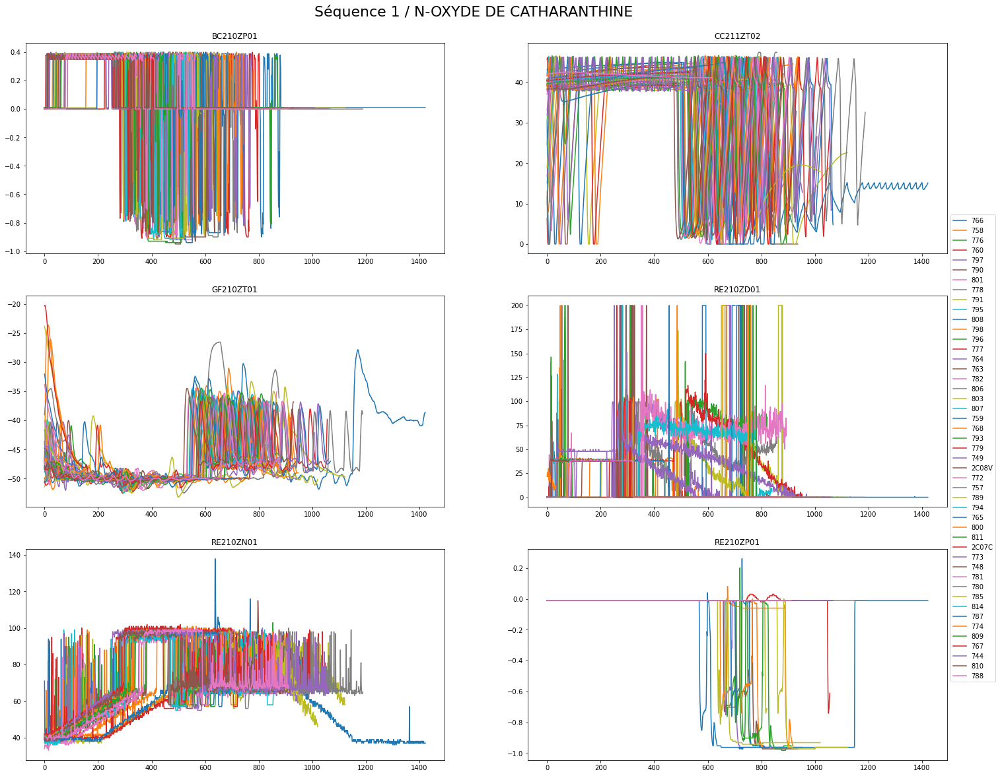

In [41]:
plt.figure(figsize=(25, 20))
OP_set = set(Dataf['OP'])   
for op in OP_set:
    selected_data =Dataf.loc[Dataf['OP'] == op]
    
    j = 321
    for i in ['BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01','RE210ZN01', 'RE210ZP01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        

title_string = " Séquence 1 / N-OXYDE DE CATHARANTHINE"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.legend(bbox_to_anchor=(1,2.60), loc="upper left")
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/Details/N-OXYDE DE CATHARANTHINE_1.pdf", bbox_inches="tight")       
plt.show()

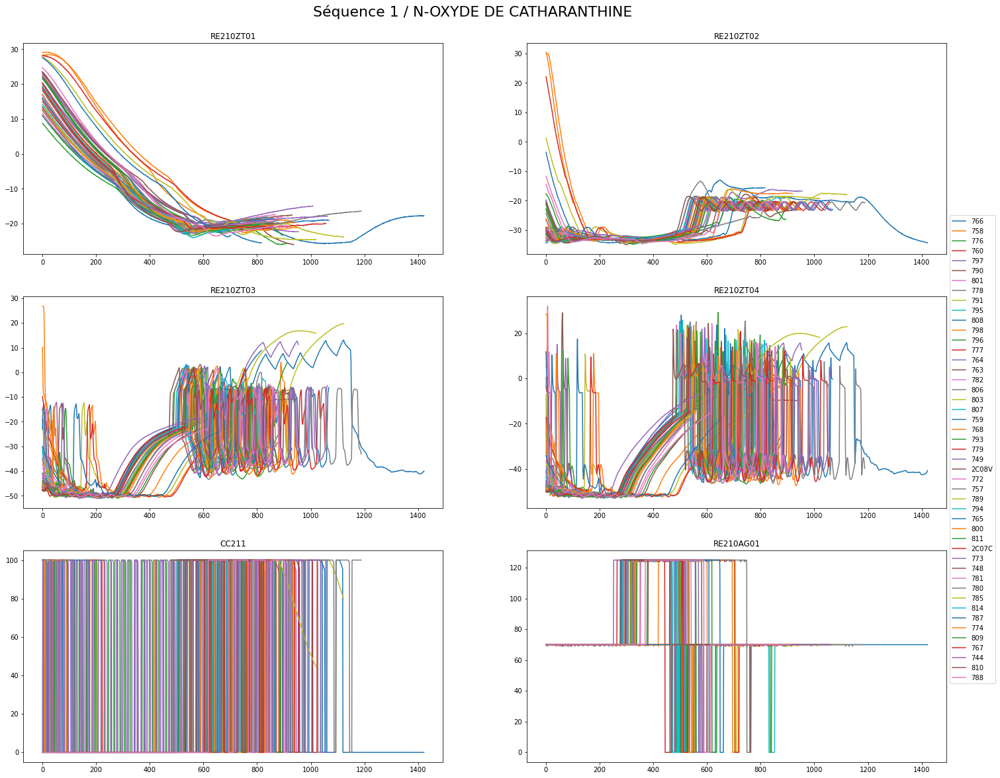

In [44]:
plt.figure(figsize=(25, 20))
OP_set = set(Dataf['OP'])   
for op in OP_set:
    selected_data =Dataf.loc[Dataf['OP'] == op]
    
    j = 321
    for i in ['RE210ZT01', 'RE210ZT02', 'RE210ZT03','RE210ZT04', 'CC211', 'RE210AG01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        
title_string = " Séquence 1 / N-OXYDE DE CATHARANTHINE"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.legend(bbox_to_anchor=(1,2.60), loc="upper left")
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/Details/N-OXYDE DE CATHARANTHINE_2.pdf", bbox_inches="tight")       
plt.show()

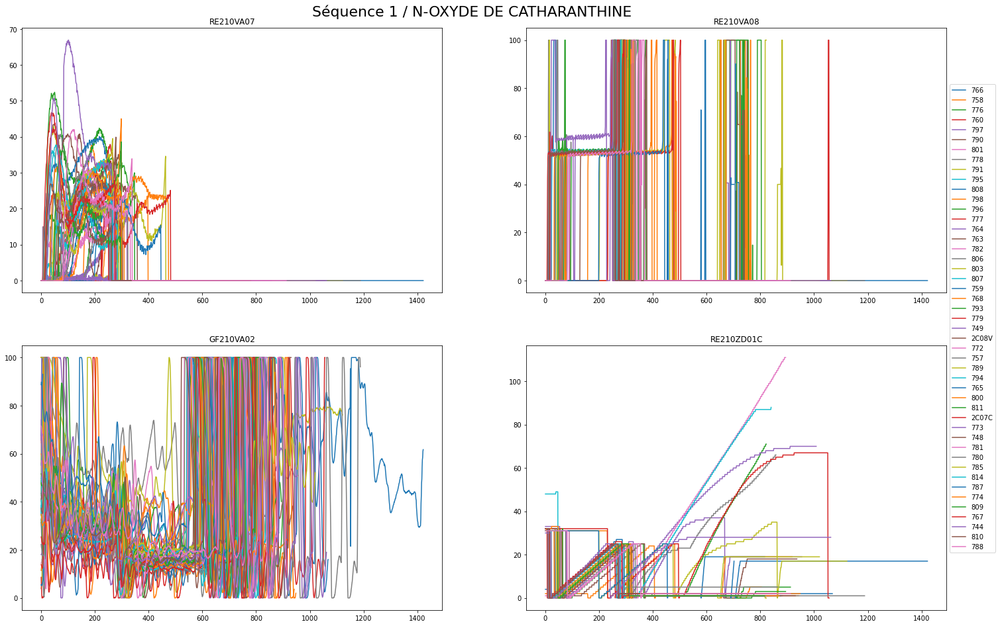

In [148]:
plt.figure(figsize=(25, 25))
OP_set = set(Dataf['OP'])   
for op in OP_set:
    selected_data =Dataf.loc[Dataf['OP'] == op]
    
    j = 321
    for i in ['RE210VA07', 'RE210VA08','GF210VA02', 'RE210ZD01C']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=op)
        plt.title(i)
        j += 1
        
title_string = " Séquence 1 / N-OXYDE DE CATHARANTHINE"
plt.suptitle(title_string, y=0.9000005, fontsize=22)
plt.legend(bbox_to_anchor=(1,2.00), loc="upper left")
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Représentation Graphique par Séquence et par capteurs/Details/N-OXYDE DE CATHARANTHINE_3.pdf", bbox_inches="tight")       
plt.show()

In [40]:
# exportation du fichier N-OXYDE dans le dossier python
Dataf.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Dataf.xlsx", index = False, header=True)


In [65]:
set(Dataf['Rendement'])

{' ',
 0.6642976397940964,
 0.6673518740535083,
 0.6702708543664815,
 0.6746493248359414,
 0.6762304391721353,
 0.6764736875315497,
 0.6769601842503785,
 0.678298050227158,
 0.680487285461888,
 0.6840143866733973,
 0.6872982395254922,
 0.6880279846037355,
 0.6889616468390004,
 0.6897307231196365,
 0.6902172198384654,
 0.690582092377587,
 0.6909469649167087,
 0.6915550858152448,
 0.6960551804644118,
 0.6975835230995381,
 0.6980011673397274,
 0.6984876640585563,
 0.7004336509338718,
 0.7017715169106512,
 0.7020147652700657,
 0.7020988047618197,
 0.707244604997476,
 0.7096770885916204,
 0.7110149545683998,
 0.7113798271075215,
 0.7122311963654719,
 0.7128393172640081,
 0.7129609414437152,
 0.7156366733972741,
 0.7158799217566885,
 0.7180691569914185,
 0.7181907811711257,
 0.7234206208985361,
 0.726096352852095,
 0.7293802057041898,
 0.7312045683997981,
 0.7324208101968702,
 0.7412993753154973,
 0.7500563162544169,
 0.752245551489147,
 0.7535834174659263}

In [17]:
Dataall['Date'] = Dataall.groupby('Lot').cumcount()
Dataall[['DateTime','CC211ZT02','Lot','Rendement', 'Date', 'RENDEMENT']]

,DateTime,CC211ZT02,Lot,Rendement,Date,RENDEMENT
0,02/09/2021 08:09,33.3,801,0.664298,0,66.42-68.21
1,02/09/2021 08:10,34.2,801,0.664298,1,66.42-68.21
2,02/09/2021 08:10,35.0,801,0.664298,2,66.42-68.21
3,02/09/2021 08:10,35.9,801,0.664298,3,66.42-68.21
4,02/09/2021 08:10,36.8,801,0.664298,4,66.42-68.21
...,...,...,...,...,...,...
38787,18/03/2019 10:16,39.2,763,,793,73.62-75.41
38788,18/03/2019 10:16,40.1,763,,794,73.62-75.41
38789,18/03/2019 10:16,40.5,763,,795,73.62-75.41
38790,18/03/2019 10:16,41.3,763,,796,73.62-75.41


In [18]:
Dataall=Dataall.dropna(subset=['RENDEMENT'])
Dataall.head(3)

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,...,Unnamed: 21,OP4 de vindoline engagé,Unnamed: 23,Quantité totale de vindoline,Poids humide d'AVLB,Poids dosé perchlo,Rendement,RENDEMENT,Unnamed: 29,Date
0,02/09/2021 08:09,0.36,33.3,-40.8,38.1,35,-0.01,11.4,-32.3,-36.3,...,520.0,NaN,NaN,4683,10348,5410,0.664298,66.42-68.21,NaN,0
1,02/09/2021 08:10,0.35,34.2,-40.5,37.8,35,-0.01,11.3,-32.1,-36.5,...,520.0,NaN,NaN,4683,10348,5410,0.664298,66.42-68.21,NaN,1
2,02/09/2021 08:10,0.35,35.0,-40.3,38.3,36,-0.01,11.2,-32.0,-36.7,...,520.0,NaN,NaN,4683,10348,5410,0.664298,66.42-68.21,NaN,2


In [108]:
#Dataall.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Dataall.xlsx", index = False, header=True)

# 4.3. Evolution de la moyenne des capteurs en fonction du temps par catégorie de rendement

In [15]:
Dataall.columns

Index(['DateTime', 'BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C', 'ID Recette', 'Libelle Recette',
       'Chapitre Recette', 'Arborescence', 'Exécuter', 'Terminer', 'OP',
       'Rendement', 'OP1 de catharantine engagé', 'Unnamed: 2',
       'OP2 de catharantine engagé', 'Unnamed: 4',
       'Quantité totale de catharantine', 'OP1 de vindoline engagé',
       'Unnamed: 17', 'Quantité totale de vindoline', 'Poids humide d'AVLB',
       'Poids dosé perchlo', 'RENDEMENT', 'Lot', 'Date'],
      dtype='object')

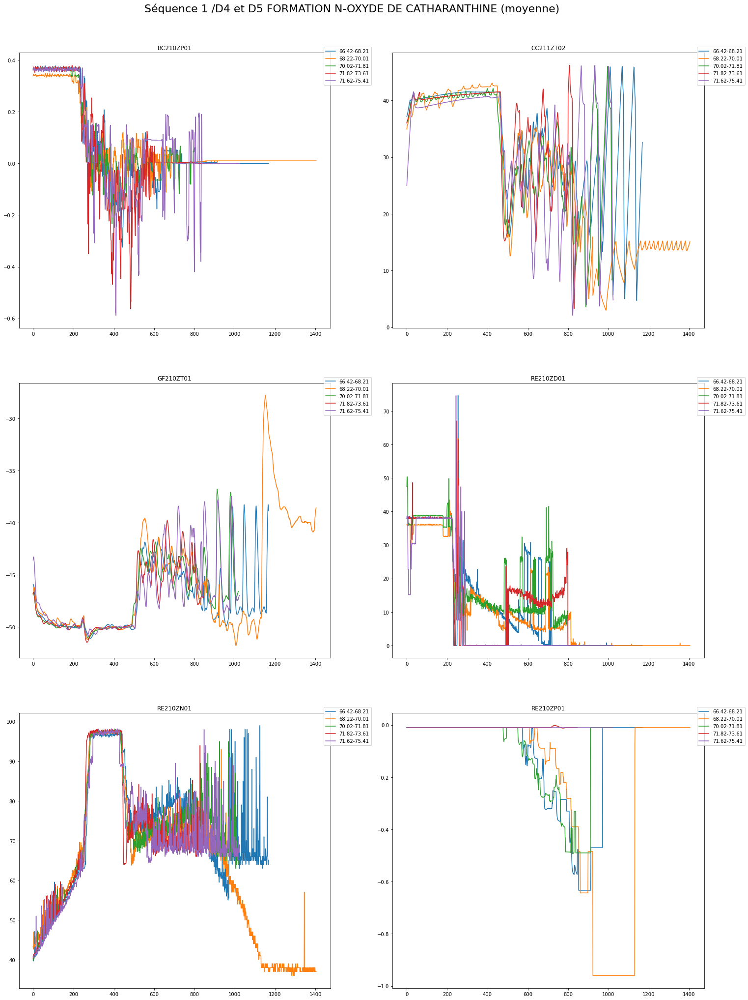

In [26]:
plt.figure(figsize=(25, 35))
OP_set = set(Dataall_AVG['RENDEMENT1'])   
for Rendement in OP_set:
    selected_data = Dataall_AVG.loc[Dataall_AVG['RENDEMENT1'] == Rendement]
    
    j = 321
    for i in ['BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01','RE210ZN01', 'RE210ZP01']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=Rendement)
        plt.title(i)
        j += 1
        handles, labels = plt.gca().get_legend_handles_labels()
        handles, labels = zip(*[ (handles[i], labels[i]) for i in sorted(range(len(handles)), key=lambda k: list(map(int,labels))[k])] )
        plt.legend(['66.42-68.21', '68.22-70.01', '70.02-71.81', '71.82-73.61', '71.62-75.41'], bbox_to_anchor=(0.9699,1.03), loc="upper left" )
        #plt.legend(['First List','Second List'], loc='upper left')

title_string = " Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE (moyenne)"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Graph_Rendement_Moyenne/FORMATION N-OXYDE DE CATHARANTHINE_1.pdf", bbox_inches="tight")       
plt.show()

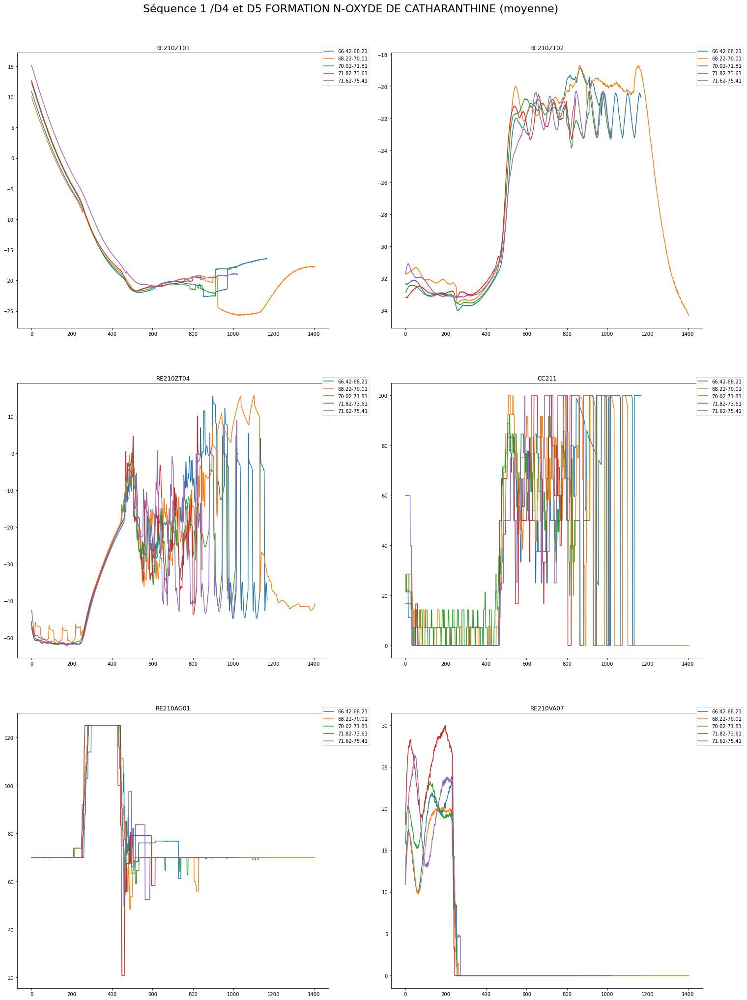

In [27]:
plt.figure(figsize=(25, 35))
OP_set = set(Dataall_AVG['RENDEMENT1'])   
for Rendement in OP_set:
    selected_data = Dataall_AVG.loc[Dataall_AVG['RENDEMENT1'] == Rendement]
    
    j = 321
    for i in ['RE210ZT01', 'RE210ZT02', 'RE210ZT04','CC211', 'RE210AG01', 'RE210VA07']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=Rendement)
        plt.title(i)
        j += 1
        handles, labels = plt.gca().get_legend_handles_labels()
        handles, labels = zip(*[ (handles[i], labels[i]) for i in sorted(range(len(handles)), key=lambda k: list(map(int,labels))[k])] )
        plt.legend(['66.42-68.21', '68.22-70.01', '70.02-71.81', '71.82-73.61', '71.62-75.41'], bbox_to_anchor=(0.9699,1.03), loc="upper left" )
        #plt.legend(['First List','Second List'], loc='upper left')

title_string = " Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE (moyenne)"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Graph_Rendement_Moyenne/FORMATION N-OXYDE DE CATHARANTHINE_2.pdf", bbox_inches="tight")       
plt.show()

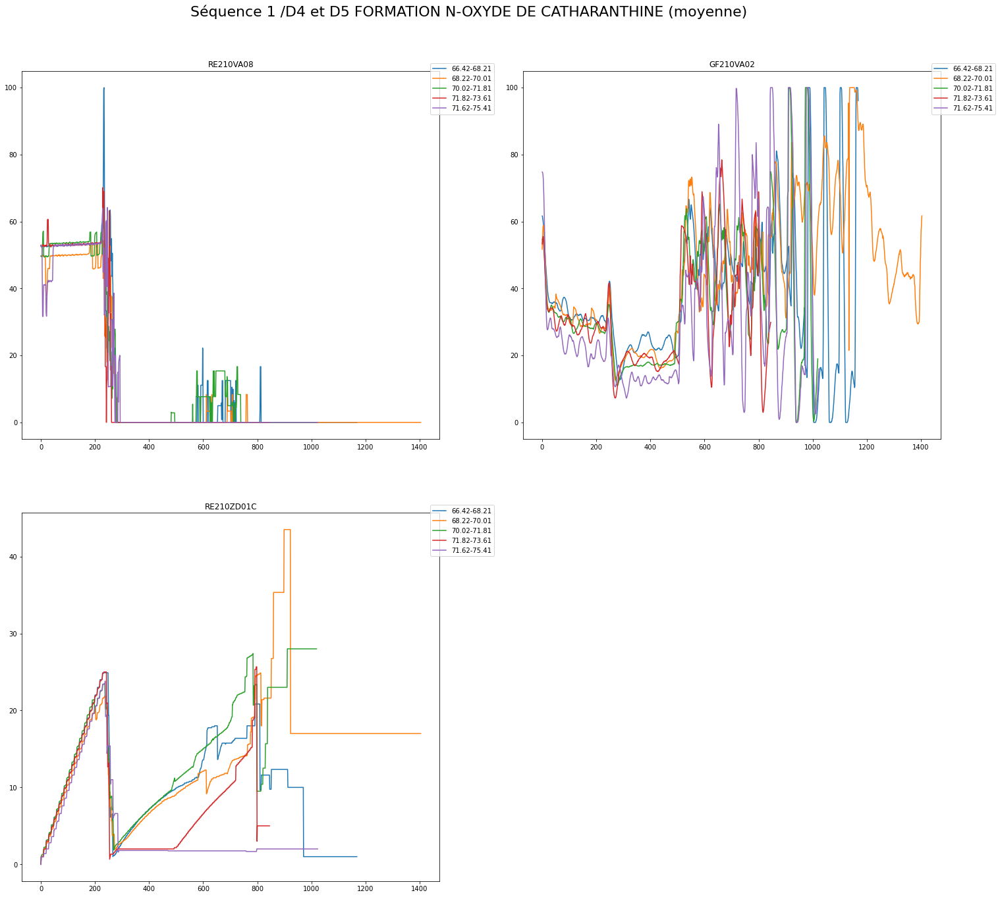

In [28]:
plt.figure(figsize=(25, 35))
OP_set = set(Dataall_AVG['RENDEMENT1'])   
for Rendement in OP_set:
    selected_data = Dataall_AVG.loc[Dataall_AVG['RENDEMENT1'] == Rendement]
    
    j = 321
    for i in ['RE210VA08', 'GF210VA02', 'RE210ZD01C']:
        plt.subplot(j)
        plt.plot(selected_data['Date'], selected_data[i], label=Rendement)
        plt.title(i)
        j += 1
        handles, labels = plt.gca().get_legend_handles_labels()
        handles, labels = zip(*[ (handles[i], labels[i]) for i in sorted(range(len(handles)), key=lambda k: list(map(int,labels))[k])] )
        plt.legend(['66.42-68.21', '68.22-70.01', '70.02-71.81', '71.82-73.61', '71.62-75.41'], bbox_to_anchor=(0.9699,1.03), loc="upper left" )
        #plt.legend(['First List','Second List'], loc='upper left')

title_string = " Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE (moyenne)"
plt.suptitle(title_string, y=0.9200005, fontsize=22)
plt.savefig("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Graph_Rendement_Moyenne/FORMATION N-OXYDE DE CATHARANTHINE_3.pdf", bbox_inches="tight")       
plt.show()

# 4.4. Evolution des capteurs en fonction du temps par catégorie de rendement

In [97]:
fig9 = px.line(Dataall, x="Date1", y="CC211",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig9.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig9.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_CC211.html")
fig9.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,line_width=0)
fig9.show()

In [98]:
fig10 = px.line(Dataall, x="Date1", y="RE210AG01",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig10.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig10.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210AG01.html")
fig10.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,line_width=0)
fig10.show()

In [99]:
fig11 = px.line(Dataall, x="Date1", y="RE210VA07",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig11.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig11.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210VA07.html")
fig11.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,line_width=0)
fig11.show()

In [100]:
fig12 = px.line(Dataall, x="Date1", y="RE210VA08",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig12.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig12.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210VA08.html")
fig12.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,line_width=0)
fig12.show()

In [101]:
fig13 = px.line(Dataall, x="Date1", y="GF210VA02",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig13.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig13.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_GF210VA02.html")
fig13.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,line_width=0)
fig13.show()

In [102]:
fig14 = px.line(Dataall, x="Date1", y="RE210ZD01C",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig14.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig14.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210ZD01C.html")

fig14.add_hline(y=50, line_dash="dot")

fig14.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,  line_dash="dot")

fig14.show()

In [103]:
fig15 = px.line(Dataall, x="Date1", y="RE210VA07",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig15.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig15.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210VA07.html")

fig15.add_hline(y=50, line_dash="dot")

fig15.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,  line_dash="dot")

fig15.show()


In [104]:
fig16 = px.line(Dataall, x="Date1", y="RE210ZT03",width=1000, height=800, color='Lot', facet_col="RENDEMENT", facet_col_wrap=2)
fig16.update_layout(title_text='Séquence 1 /D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE', title_x=0.5)
fig16.write_html("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Representation Graphique par Rendement et Capteurs/D4 et D5 FORMATION N-OXYDE DE CATHARANTHINE_RE210VA07.html")

fig16.add_hline(y=50, line_dash="dot")

fig16.add_vrect(x0="0", x1="276", fillcolor="cyan",  opacity=0.25,  line_dash="dot")

fig16.show()

In [107]:
Dataall.columns

Index(['DateTime', 'BC210ZP01', 'CC211ZT02', 'GF210ZT01', 'RE210ZD01',
       'RE210ZN01', 'RE210ZP01', 'RE210ZT01', 'RE210ZT02', 'RE210ZT03',
       'RE210ZT04', 'CC211', 'RE210AG01', 'RE210VA07', 'RE210VA08',
       'GF210VA02', 'RE210ZD01C', 'DateTime_Out', 'ID Recette',
       'Libelle Recette', 'Lot', 'Chapitre Recette', 'Arborescence',
       'Exécuter', 'Terminer', 'OP', 'OP1 de catharantine engagé',
       'Unnamed: 2', 'OP2 de catharantine engagé', 'Unnamed: 4',
       'OP3 de catharantine engagé', 'Unnamed: 6',
       'OP4 de catharantine engagé', 'Unnamed: 8',
       'OP5 de catharantine engagé', 'Unnamed: 10',
       'OP6 de catharantine engagé', 'Unnamed: 12',
       'OP7 de catharantine engagé', 'Unnamed: 14',
       'Quantité totale de catharantine', 'OP1 de vindoline engagé',
       'Unnamed: 17', 'OP2 de vindoline engagé', 'Unnamed: 19',
       'OP3 de vindoline engagé', 'Unnamed: 21', 'OP4 de vindoline engagé',
       'Unnamed: 23', 'Quantité totale de vindoline', 'Po

# Taches realisées sur les étapes 2 et 3

In [ ]:
#Importation de library 
import re
import warnings
from pandas.core.common import SettingWithCopyWarning

warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)
warnings.simplefilter(action = 'ignore')
qm_path = 'C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/'
output_path = './'

filanteE2 = pd.read_excel('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Filante Vinorelbine.xlsx', sheet_name='B1 et B2', converters={'OP':str} , header=1)
filanteE2.head(3)

In [ ]:
filanteE2 = filanteE2.drop(0, axis='index').rename(columns={'Unnamed: 0': 'OP'})

In [ ]:
filanteE2=filanteE2.dropna(subset=['OP'])
filanteE2.head(3)

In [ ]:
rm_quote = lambda x: x.replace('"', '')
rm_single_quote = lambda x: x.replace("'", "")

filanteE2['OP'] = filanteE2['OP'].astype('str')
filanteE2 = filanteE2.rename(columns = rm_quote)
filanteE2 = filanteE2.rename(columns = rm_single_quote)
filanteE2 = filanteE2.rename(columns = {x:"B1 et B2 - {}".format(x) for x in filanteE2.columns[9:]}).reset_index(drop = True)

In [ ]:
filanteE2

In [ ]:
E2 = pd.read_excel('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Listes Sequences et opérations E1_E2_E3.xlsx', sheet_name='DataE2')
E2

In [ ]:
E2['Lot']=E2['Lot'].replace(['OP','_','-','BIS','E1'], '', regex=True)
E2.head()

In [ ]:
E2j = pd.merge(E2, filanteE2, left_on="Lot", right_on="OP")

In [ ]:
E2j.dtypes

In [ ]:
E2j.

In [ ]:
E2j.head(3)

In [ ]:
E2j.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/E2j.xlsx", index = False, header=True)

In [ ]:
x1=0.363
x2=0.566
pas2=(x2-x1)/3
pas2


In [ ]:
E3 = pd.read_excel('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Listes Sequences et opérations E1_E2_E3.xlsx', sheet_name='DataE3')

In [ ]:
E3['Lot']=E3['Lot'].replace(['OP','_','-','BIS','E1'], '', regex=True)
E3j = pd.merge(E3, filanteE2, left_on="Lot", right_on="OP")

In [ ]:
E3j.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/E3j.xlsx", index = False, header=True)

In [ ]:
x1=0.363
x2=0.539
pas3=(x2-x1)/3
pas3

In [ ]:
E1 = pd.read_excel('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Listes Sequences et opérations E1_E2_E3.xlsx', sheet_name='DataE1')


In [ ]:
E1['Lot']=E1['Lot'].replace(['OP','_','-','BIS','E1'], '', regex=True)
E1.head()

In [ ]:
E1j = pd.merge(E1, filante, left_on="Lot", right_on="OP")
E1j.head()

In [ ]:
E1j.to_excel("C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/E1j.xlsx", index = False, header=True)

In [ ]:
x1=0.667351874

x2=0.752245551489147
pas1= (x1-x2)/3
pas1

In [48]:
Data = pd.read_csv('C:/Users/amousss/OneDrive - Pierre Fabre SA/Projet Vinorelbine/Python/Functional Data Explorer/Data.csv', sep=';')


In [49]:
Data

,DateTime,BC210ZP01,CC211ZT02,GF210ZT01,RE210ZD01,RE210ZN01,RE210ZP01,RE210ZT01,RE210ZT02,RE210ZT03,RE210ZT04,CC211,RE210AG01,RE210VA07,RE210VA08,GF210VA02,RE210ZD01C,Lot,Rendement,RENDEMENT
0,04/03/2018 11:47,0.36,39.1,-48.5,47.9,40,-0.01,8.2,-34.0,-48.6,-50.3,0.0,70,49.1,59.0,34.6,0,744,0.715636673,70.02-71.81
1,04/03/2018 11:47,0.35,39.1,-48.7,47.9,40,-0.01,8.1,-34.0,-48.9,-50.6,0.0,70,49.2,59.2,32.1,1,744,0.715636673,70.02-71.81
2,04/03/2018 11:47,0.36,39.1,-48.9,49.7,41,-0.01,8.0,-34.0,-49.1,-50.8,0.0,70,50.6,58.7,29.6,1,744,0.715636673,70.02-71.81
3,04/03/2018 11:47,0.38,38.7,-49.1,48.0,40,-0.01,7.9,-34.0,-49.2,-50.9,0.0,70,50.1,58.2,27.6,1,744,0.715636673,70.02-71.81
4,04/03/2018 11:47,0.37,38.3,-49.2,47.9,40,-0.01,7.8,-34.0,-49.4,-51.1,0.0,70,50.1,58.4,25.3,1,744,0.715636673,70.02-71.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38787,02/10/2022 09:50,0.01,39.2,-50.3,0.0,56,-0.01,-20.2,-30.4,-22.8,-17.1,0.0,0,0.0,0.0,5.6,2,2C07C,0.753583,73.62-75.41
38788,02/10/2022 09:50,0.01,39.2,-50.3,0.0,56,-0.01,-20.3,-30.3,-22.7,-17.0,0.0,70,0.0,0.0,5.2,2,2C07C,0.753583,73.62-75.41
38789,02/10/2022 09:50,0.01,39.2,-50.3,0.0,58,-0.01,-20.3,-30.6,-22.7,-16.9,0.0,70,0.0,0.0,5.3,2,2C07C,0.753583,73.62-75.41
38790,02/10/2022 09:50,0.01,39.2,-50.3,0.0,62,-0.01,-20.5,-30.8,-22.7,-16.8,0.0,70,0.0,0.0,5.2,2,2C07C,0.753583,73.62-75.41


In [50]:
Data['Date'] = Data.groupby('Lot').cumcount()
Data[['DateTime','CC211ZT02','Lot','Date', ]]

,DateTime,CC211ZT02,Lot,Date
0,04/03/2018 11:47,39.1,744,0
1,04/03/2018 11:47,39.1,744,1
2,04/03/2018 11:47,39.1,744,2
3,04/03/2018 11:47,38.7,744,3
4,04/03/2018 11:47,38.3,744,4
...,...,...,...,...
38787,02/10/2022 09:50,39.2,2C07C,465
38788,02/10/2022 09:50,39.2,2C07C,466
38789,02/10/2022 09:50,39.2,2C07C,467
38790,02/10/2022 09:50,39.2,2C07C,468
